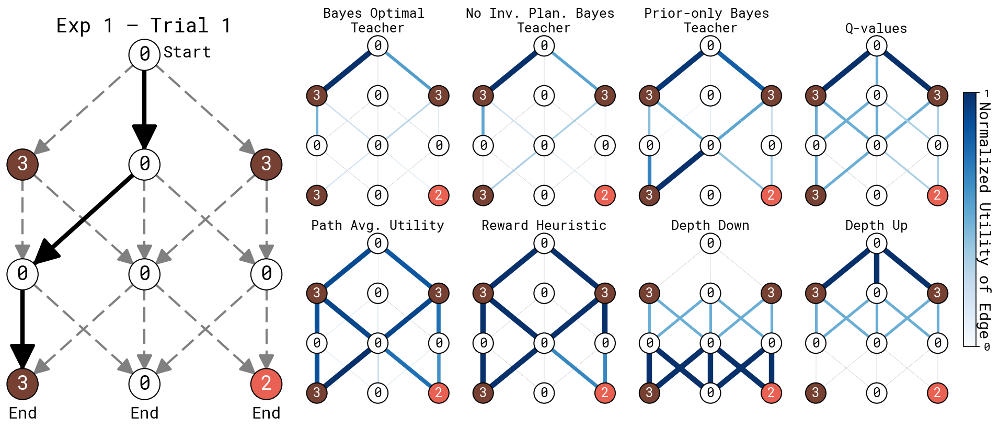

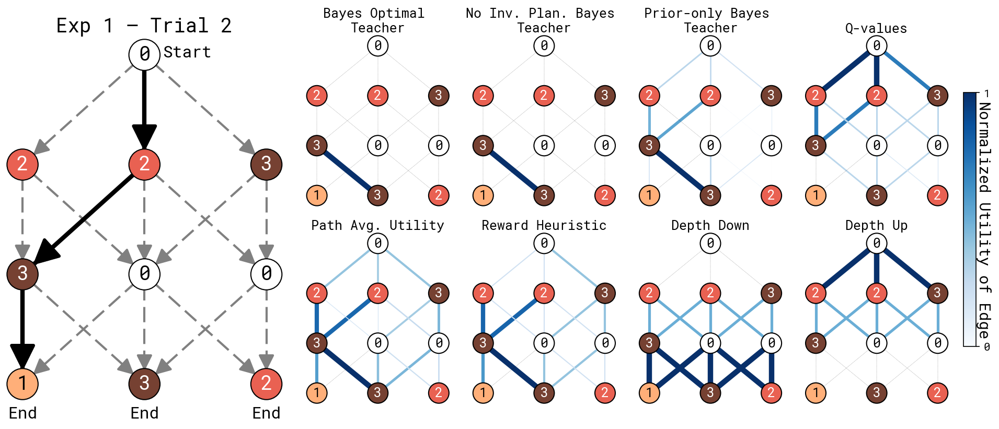

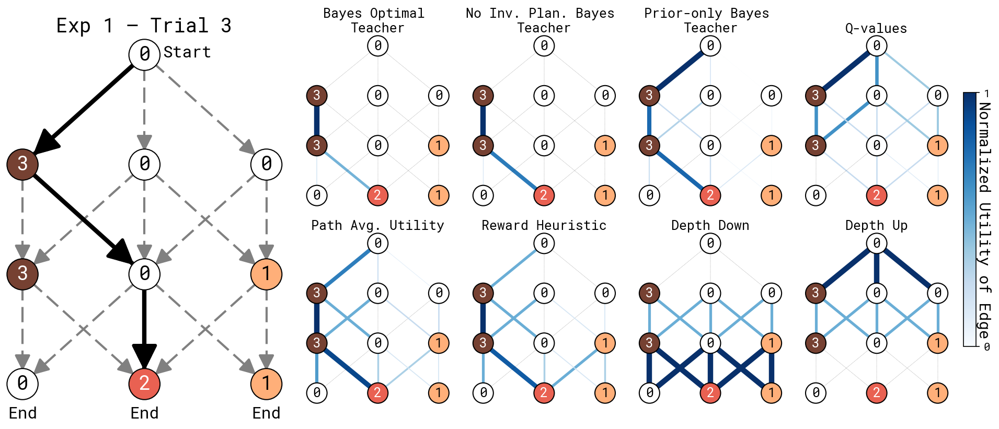

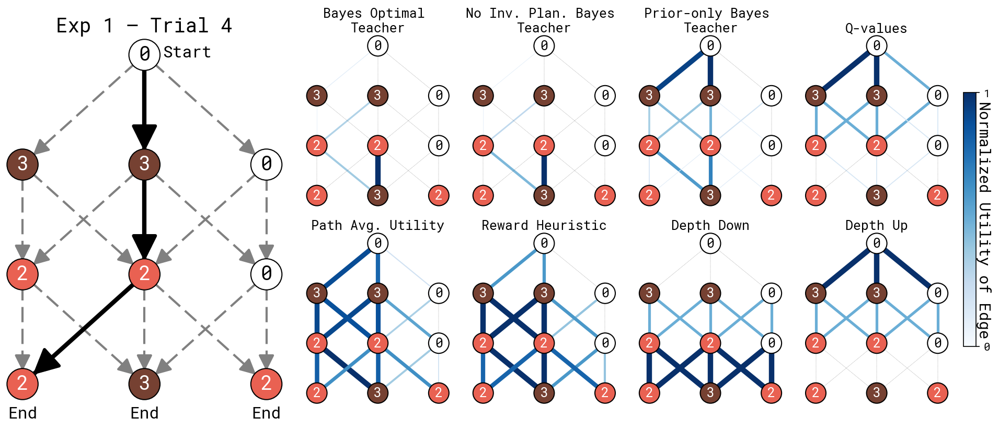

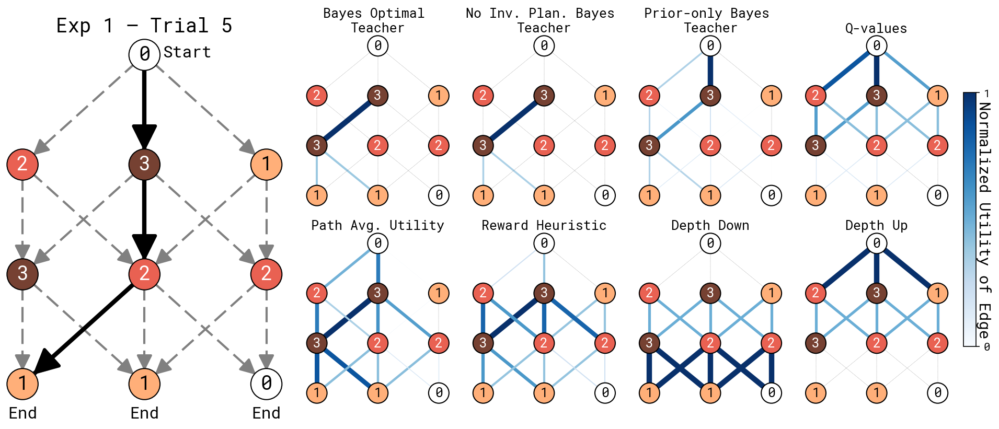

...

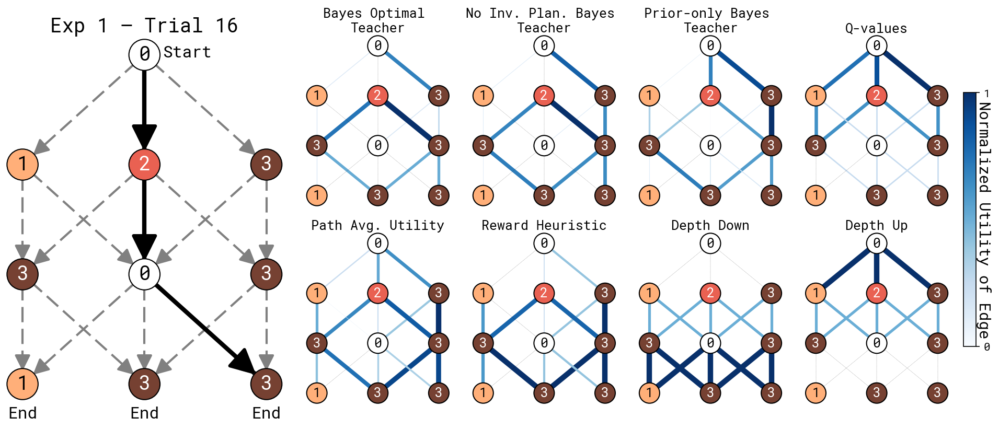

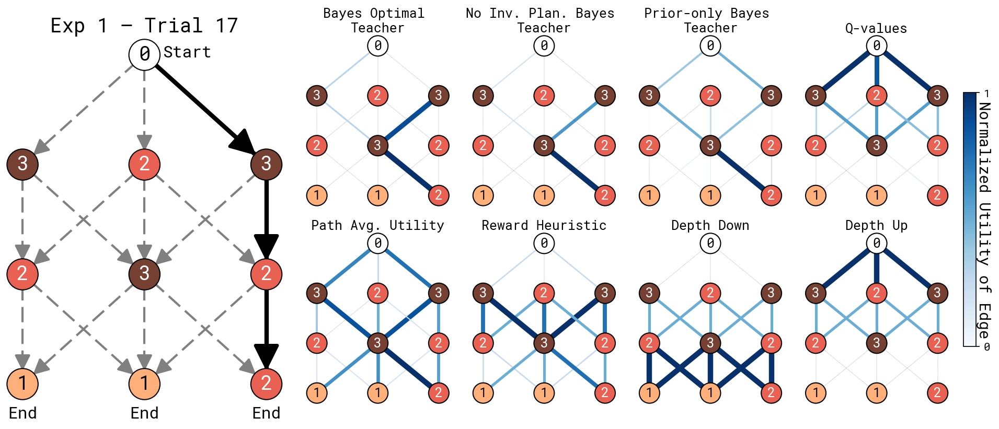

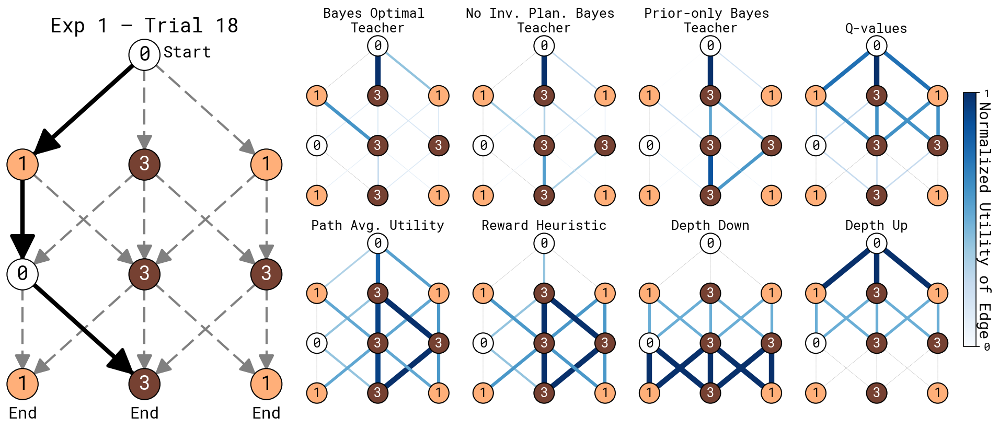

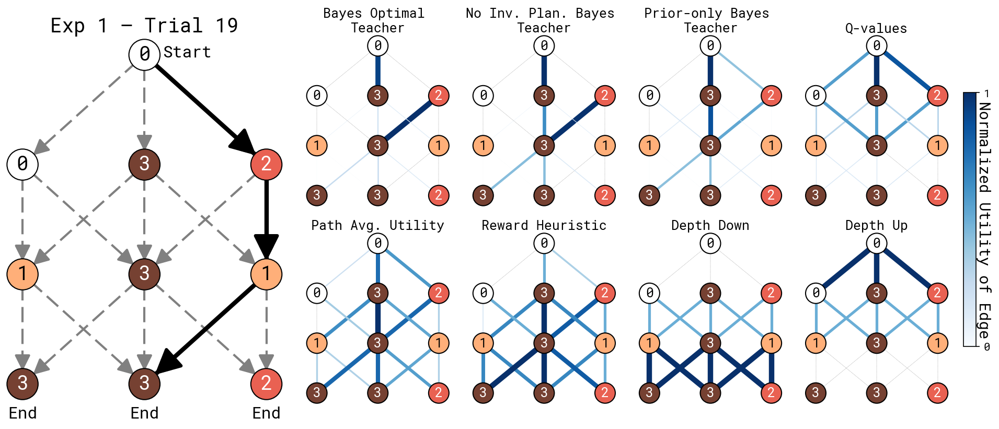

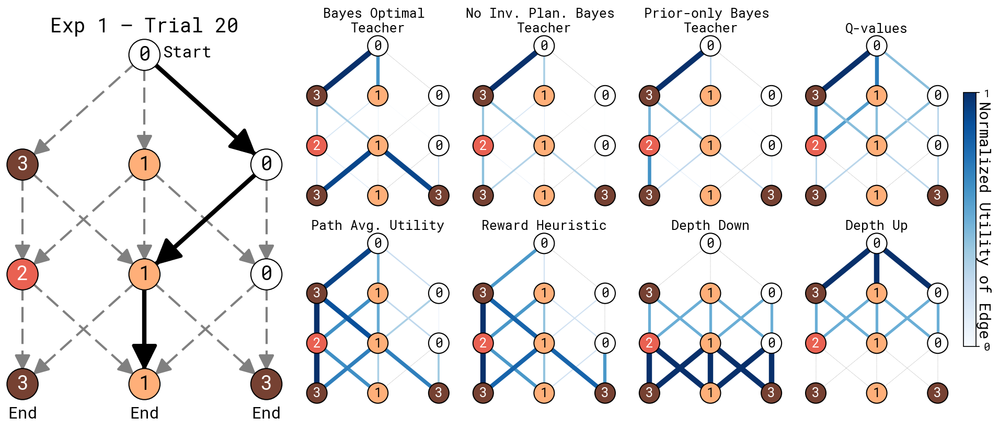

In [ ]:
"""
========================================================
Author: Sevan Harootonian
Affiliation: Princeton University
========================================================
"""

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.gridspec import GridSpec

def plot_exp1_all(simdata_exp1, save=False):
    """
    Render ALL trials from simdata_exp1 using your original layout & styling.
    Shows each figure; if save=True, also writes PDFs to ./figs_exp1/.
    """
    # ---- constants / labels ----
    mpl.rcParams['font.family'] = 'Roboto Mono'
    pretty_names = {
        "Q-values": "Q-values",
        "PathAvgUtility": "Path Avg. Utility",
        "DepthDown": "Depth Down",
        "DepthUP": "Depth Up",
        "feature_reward_sum": "Reward Heuristic",
        "OBM_advice_utility": "Bayes Optimal \nTeacher",
        "NBM_advice_utility": "No Inv. Plan. Bayes \nTeacher",
        "POM_advice_utility": "Prior-only Bayes \nTeacher",
    }
    utilities_names = [
        ['OBM_advice_utility', 'NBM_advice_utility', 'POM_advice_utility', 'Q-values'],
        ['PathAvgUtility', 'feature_reward_sum', 'DepthDown', 'DepthUP']
    ]
    DEPTH_UP = {
        ((0, 1), (1, 0)): 1, ((2, 1), (1, 0)): 1, ((1, 2), (0, 1)): 2,
        ((0, 2), (1, 1)): 2, ((1, 1), (1, 0)): 1, ((2, 2), (2, 1)): 2,
        ((1, 3), (2, 2)): 3, ((2, 1), (2, 0)): 1, ((2, 2), (1, 1)): 2,
        ((1, 3), (1, 2)): 3, ((1, 1), (2, 0)): 1, ((0, 1), (0, 0)): 1,
        ((1, 3), (0, 2)): 3, ((1, 2), (2, 1)): 2, ((0, 2), (0, 1)): 2,
        ((1, 2), (1, 1)): 2, ((1, 1), (0, 0)): 1
    }
    DEPTH_DOWN = {
        ((0, 1), (1, 0)): 3, ((2, 1), (1, 0)): 3, ((1, 2), (0, 1)): 2,
        ((0, 2), (1, 1)): 2, ((1, 1), (1, 0)): 3, ((2, 2), (2, 1)): 2,
        ((1, 3), (2, 2)): 1, ((2, 1), (2, 0)): 3, ((2, 2), (1, 1)): 2,
        ((1, 3), (1, 2)): 1, ((1, 1), (2, 0)): 3, ((0, 1), (0, 0)): 3,
        ((1, 3), (0, 2)): 1, ((1, 2), (2, 1)): 2, ((0, 2), (0, 1)): 2,
        ((1, 2), (1, 1)): 2, ((1, 1), (0, 0)): 3
    }
    out_dir = "figs_exp1"
    if save:
        os.makedirs(out_dir, exist_ok=True)

    def plot_edge_utilities(graph, rewards, utilities, ax, cmap, node_size, linewidth=None, plot_normalized=True):
        normalized_utility = {edge: utilities[edge] - min(utilities.values()) for edge in utilities} if utilities else {}
        for edge in graph:
            x, y = np.array(edge).T
            value = (normalized_utility.get(edge, 0.0) / max(normalized_utility.values())) if (plot_normalized and normalized_utility) else utilities.get(edge, 0.0)
            if value < 0.01:
                ax.plot(x, y, '--k', linewidth=.1); continue
            color = 'gray' if cmap is None else cmap(value)
            if linewidth is None:
                lw, ls, add_arrow = value * 5, '-', False
            else:
                lw, ls, add_arrow = linewidth, (5, (7, 3)), True
            ax.plot(x, y, color=color, linewidth=lw, linestyle=ls)
            if add_arrow:
                dx, dy = x[1] - x[0], y[1] - y[0]
                L = np.hypot(dx, dy)
                if L == 0: 
                    continue
                end_frac = 1 - (0.12 / L)
                xe, ye = x[0] + end_frac * dx, y[0] + end_frac * dy
                start_frac = end_frac - 0.10
                xs, ys = x[0] + start_frac * dx, y[0] + start_frac * dy
                ax.annotate('', xy=(xe, ye), xytext=(xs, ys),
                            arrowprops=dict(arrowstyle='-|>', linewidth=lw, color=color,
                                            mutation_scale=10 + 10 * lw, shrinkA=0, shrinkB=0),
                            zorder=3)
        for node, r in rewards.items():
            node_color, node_font = {0:("#FFFFFF",'black'),1:("#FFAF79",'black'),2:("#E96152",'white'),3:("#764132",'white')}[int(r)]
            ax.text(node[0], node[1], f"{int(r):d}", fontsize=node_size, ha='center', va='center',
                    color=node_font, bbox=dict(facecolor=node_color, boxstyle='circle'))

    # iterate trials
    df = simdata_exp1.reset_index(drop=True)
    for idx, row in df.iterrows():
        # --- build data for this trial ---
        util_cols = ['OBM_advice_utility','NBM_advice_utility','POM_advice_utility','Q-values','PathAvgUtility','feature_reward_sum']
        true_graph = set()
        for col in util_cols:
            if isinstance(row[col], dict):
                true_graph |= set(row[col].keys())
        true_graph |= set(DEPTH_UP.keys()) | set(DEPTH_DOWN.keys())

        data = {
            'true_graph': true_graph,
            'learner Rewards': row['learner_rewards'],
            'traj': tuple(row['traj']),
            'OBM_advice_utility': {e: float(v) for e, v in row['OBM_advice_utility'].items()},
            'NBM_advice_utility': {e: float(v) for e, v in row['NBM_advice_utility'].items()},
            'POM_advice_utility': {e: float(v) for e, v in row['POM_advice_utility'].items()},
            'Q-values':          {e: float(v) for e, v in row['Q-values'].items()},
            'PathAvgUtility':    {e: float(v) for e, v in row['PathAvgUtility'].items()},
            'feature_reward_sum':{e: float(v) for e, v in row['feature_reward_sum'].items()},
            'DepthUP': DEPTH_UP,
            'DepthDown': DEPTH_DOWN,
        }

        # --- figure (exact original layout) ---
        fig = plt.figure(figsize=(16, 6))
        gs = GridSpec(2, 5, figure=fig, width_ratios=[2,1,1,1,1], height_ratios=[1,1])
        cmap = plt.get_cmap("Blues")

        # big left
        ax_big = fig.add_subplot(gs[:, 0])
        plot_edge_utilities(data['true_graph'], data['learner Rewards'],
                            {e:1 for e in data['true_graph']}, ax_big,
                            cmap=None, linewidth=2, plot_normalized=False, node_size=18)
        ax_big.set_title(f"Exp 1 — Trial {idx+1}", fontsize=18)
        ax_big.set_axis_off()

        # trajectory
        traj = data['traj']
        for i in range(len(traj)-1):
            x, y = np.array([traj[i], traj[i+1]]).T
            ax_big.plot(x, y, color='black', linewidth=4, linestyle='-')
            dx, dy = x[1]-x[0], y[1]-y[0]
            L = np.hypot(dx, dy)
            if L == 0:
                continue
            end_frac = 1 - (0.12 / L)
            xe, ye = x[0] + end_frac*dx, y[0] + end_frac*dy
            start_frac = end_frac - 0.10
            xs, ys = x[0] + start_frac*dx, y[0] + start_frac*dy
            ax_big.annotate('', xy=(xe,ye), xytext=(xs,ys),
                            arrowprops=dict(arrowstyle='-|>', linewidth=3, color='black',
                                            mutation_scale=50, shrinkA=0, shrinkB=0),
                            zorder=5)

        # small panels
        for col in range(1, 5):
            for r in range(2):
                ax = fig.add_subplot(gs[r, col])
                key = utilities_names[r][col-1]
                plot_edge_utilities(data['true_graph'], data['learner Rewards'], data[key], ax, cmap, node_size=12)
                ax.set_axis_off()
                ax.set_title(pretty_names[key])

        # colorbar
        norm = mpl.colors.Normalize(vmin=0, vmax=1)
        sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
        cbar = fig.colorbar(sm, ax=fig.get_axes(), fraction=0.02, pad=0.02, shrink=0.7)
        cbar.set_label('Normalized Utility of Edge', rotation=270, labelpad=1)
        cbar.ax.tick_params(labelsize=10); cbar.set_ticks([0,1]); cbar.set_ticklabels(['0','1'])

        # start/end labels
        ax_big.text(traj[0][0] + 0.35, traj[0][1] - 0.05, "Start", ha='center', va='bottom', fontsize=15)
        nodes = set(); 
        for (a,b) in data['true_graph']: nodes.add(a); nodes.add(b)
        min_y = min(n[1] for n in nodes)
        for (x_end, y_end) in [n for n in nodes if n[1] == min_y]:
            ax_big.text(x_end, y_end - 0.2, "End", ha='center', va='top', fontsize=15)

        if save:
            fig.savefig(os.path.join(out_dir, f"exp1_trial_{idx+1}.pdf"), dpi=300, bbox_inches='tight')

        plt.show()
        # keep figures open while reviewing; close manually if desired


# just show all trials
simdata_exp1 = pd.read_pickle('data/sim/exp1/exp1_modelsim.pickle')
plot_exp1_all(simdata_exp1, save=True)


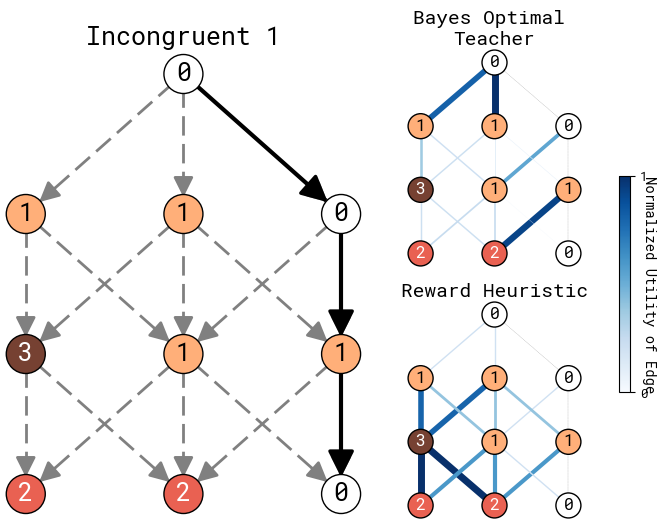

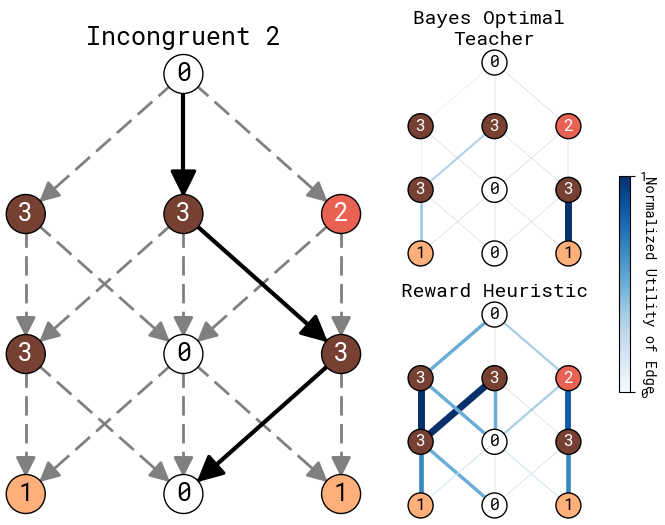

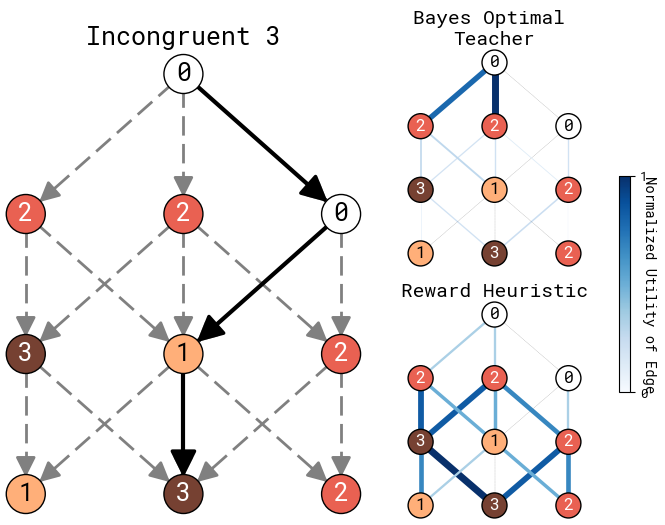

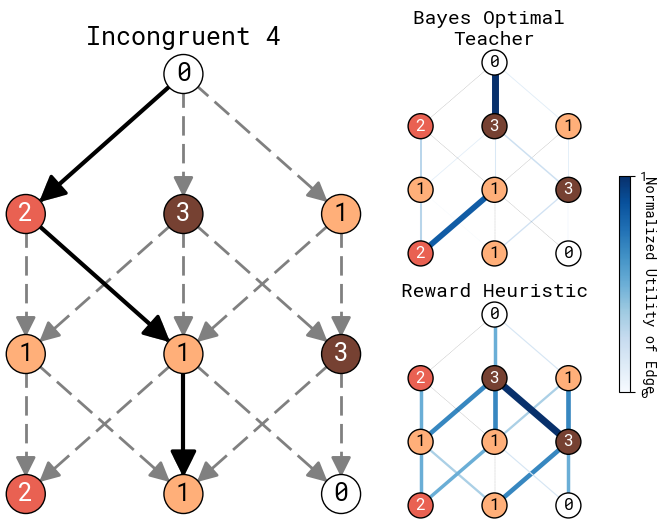

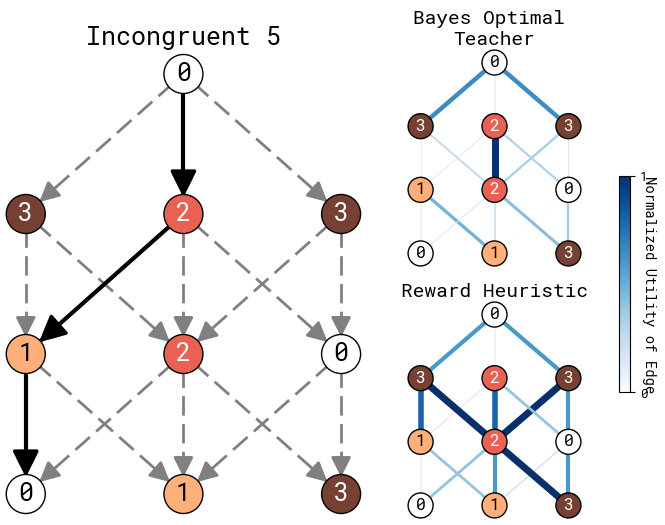

...

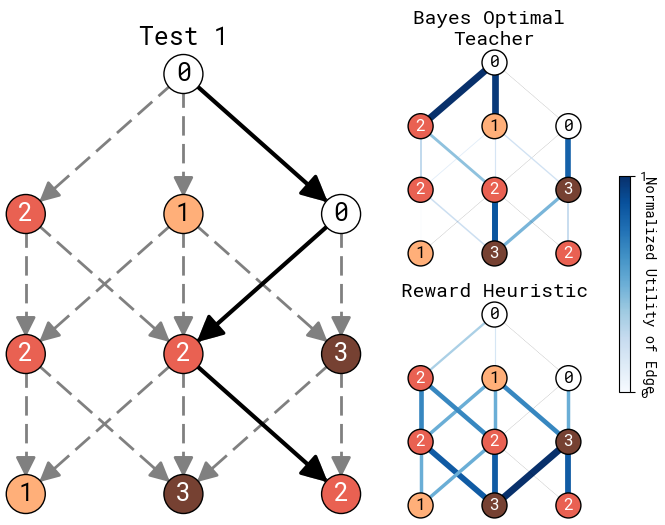

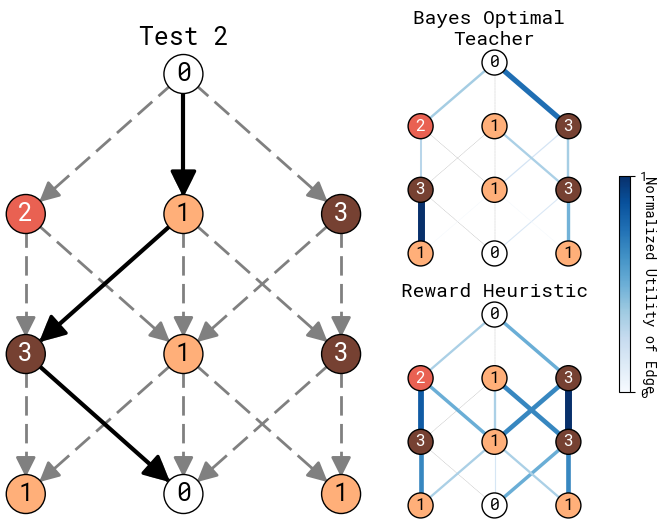

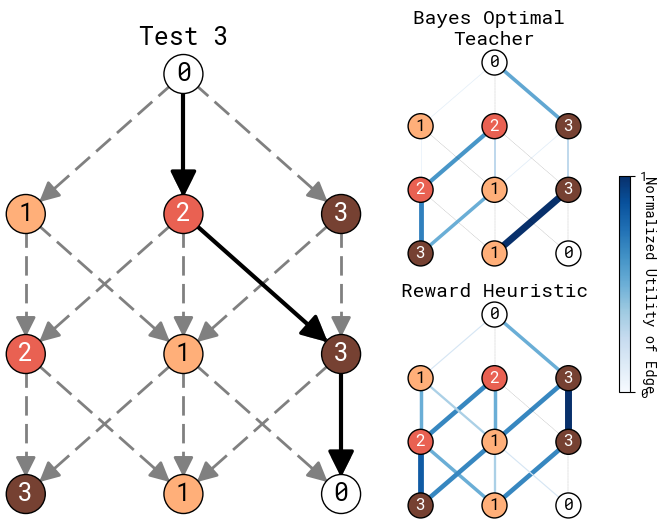

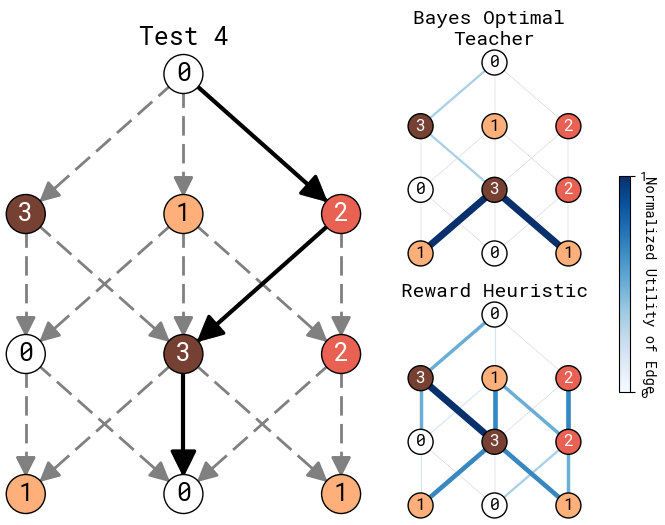

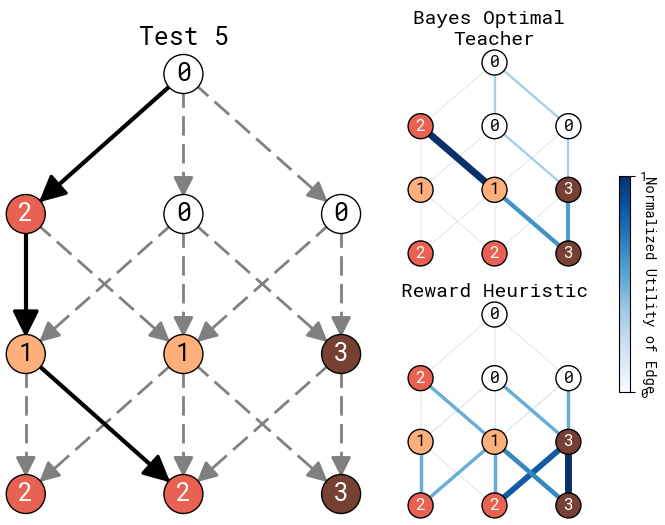

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
from functions.graphWorld import intTocoord
from matplotlib.gridspec import GridSpec

mpl.rcParams['font.family'] = 'Roboto Mono'

def _title_from_trial_id(tid):
    s = str(tid)
    if s.startswith('incong_'): return f"Incongruent {int(s.split('_')[1]) + 1}"
    if s.startswith('cong_'):   return f"Congruent {int(s.split('_')[1]) + 1}"
    if s.startswith('test_'):   return f"Test {int(s.split('_')[1]) + 1}"
    return s

def _is_path_sequence(traj):
    """True if traj looks like an ordered list/tuple of node coords, e.g., [(1,3),(0,2),(1,1),(1,0)]."""
    if not isinstance(traj, (list, tuple)) or len(traj) < 2:
        return False
    return all(isinstance(p, (list, tuple)) and len(p) == 2 and isinstance(p[0], int) and isinstance(p[1], int)
               for p in traj)

def _is_edge_set(traj):
    """True if traj looks like a set/list of edges: {((x,y),(x,y)), ...}."""
    if not isinstance(traj, (set, list, tuple)) or len(traj) == 0:
        return False
    sample = next(iter(traj))
    return (isinstance(sample, (list, tuple)) and len(sample) == 2 and
            isinstance(sample[0], (list, tuple)) and len(sample[0]) == 2 and
            isinstance(sample[1], (list, tuple)) and len(sample[1]) == 2)

def _node_to_edge_util(node_vals, edges, mode='dest'):
    """Convert node-valued dict to edge utilities by propagating node values to edges."""
    out = {}
    for (u, v) in edges:
        if mode == 'dest':
            val = node_vals.get(v, 0.0)
        elif mode == 'src':
            val = node_vals.get(u, 0.0)
        else:  # 'avg'
            val = 0.5 * (node_vals.get(u, 0.0) + node_vals.get(v, 0.0))
        out[(u, v)] = float(val)
    return out

def plot_edge_utilities(graph, rewards, utilities, ax, cmap, node_size, linewidth=None, plot_normalized=True):
    """Same drawing behavior you used in Exp1: normalize edge utilities; draw node bubbles with 0..3 palette."""
    normalized_utility = {edge: utilities[edge] - min(utilities.values()) for edge in utilities} if utilities else {}
    for edge in graph:
        x, y = np.array(edge).T
        value = (normalized_utility.get(edge, 0.0) / max(normalized_utility.values())) if (plot_normalized and normalized_utility) else utilities.get(edge, 0.0)
        if value < 0.01 and linewidth is None:
            ax.plot(x, y, '--k', linewidth=.1); continue
        color = 'gray' if cmap is None else cmap(value)
        if linewidth is None:
            lw, ls, add_arrow = value * 5, '-', False
        else:
            lw, ls, add_arrow = linewidth, (5, (7, 3)), True
        ax.plot(x, y, color=color, linewidth=lw, linestyle=ls)
        if add_arrow:
            dx, dy = x[1] - x[0], y[1] - y[0]
            L = np.hypot(dx, dy)
            if L == 0: 
                continue
            end_frac = 1 - (0.12 / L)
            xe, ye = x[0] + end_frac * dx, y[0] + end_frac * dy
            start_frac = end_frac - 0.10
            xs, ys = x[0] + start_frac * dx, y[0] + start_frac * dy
            ax.annotate('', xy=(xe,ye), xytext=(xs,ys),
                        arrowprops=dict(arrowstyle='-|>', linewidth=lw, color=color,
                                        mutation_scale=10 + 10 * lw, shrinkA=0, shrinkB=0),
                        zorder=3)

    # node bubbles (palette 0..3)
    palette = {
        0: ("#FFFFFF", 'black'),
        1: ("#FFAF79", 'black'),
        2: ("#E96152", 'white'),
        3: ("#764132", 'white'),
    }
    for node, r in (rewards or {}).items():
        v = int(r)
        if v not in (0,1,2,3):  # safety clamp; shouldn't happen if data is 0..3
            v = max(0, min(3, v))
        face, font = palette[v]
        ax.text(node[0], node[1], f"{v:d}", fontsize=node_size, ha='center', va='center',
                color=font, bbox=dict(facecolor=face, boxstyle='circle'))

def plot_exp2_like_exp1(simdata_exp2, idx=0, save=False, save_path="exp2_trial.pdf", reward_to_edge='dest'):
    """
    Exp2 figure matching Exp1 layout:
      - Big left: graph with node bubbles + trajectory overlay (if available)
      - Right column (top→bottom): [ Bayes Optimal Teacher | Reward Heuristic ]
      - Single shared colorbar on the right
    Requires your preprocessed/renamed simdata_exp2 (see note above).
    """
    row = simdata_exp2.reset_index(drop=True).iloc[int(idx)]

    # Gather edges for drawing
    edges_conn = row['traj'] if 'traj' in row and row['traj'] is not None else set()
    edges_uobm = set(row['Bayes Optimal Teacher'].keys()) if 'Bayes Optimal Teacher' in row else set()
    # If Reward Heuristic is node-valued, we'll convert it to edges later, but include nodes now
    true_graph = set(edges_conn) | set(edges_uobm)

    # Node rewards for bubbles
    rewards_nodes = row.get('learner_rewards', {})

    # Convert Reward Heuristic to edge utilities if node-valued
    RH = row['Reward Heuristic']
    if RH:
        sample_key = next(iter(RH))
        if isinstance(sample_key, tuple) and len(sample_key) == 2 and isinstance(sample_key[0], int):
            # node-valued → convert to edges using 'dest' (default)
            u_reward = _node_to_edge_util(RH, true_graph, mode=reward_to_edge)
        else:
            # already edge-valued
            u_reward = RH
            true_graph |= set(u_reward.keys())
    else:
        u_reward = {}

    # OBM utilities
    u_obm = row['Bayes Optimal Teacher'] or {}
    true_graph |= set(u_obm.keys())

    # ---- FIGURE: 2 rows x 2 cols (left big spanning both rows; right has 2 stacked panels) ----
    fig = plt.figure(figsize=(8, 6))
    gs = GridSpec(2, 2, figure=fig, width_ratios=[1.6, 1], height_ratios=[1, 1])
    cmap = plt.get_cmap("Blues")

    # Left big panel (uniform edges; plot trajectory overlay if we can)
    ax_big = fig.add_subplot(gs[:, 0])
    plot_edge_utilities(true_graph, rewards_nodes, {e: 1.0 for e in true_graph},
                        ax_big, cmap=None, linewidth=2, plot_normalized=False, node_size=18)
    ax_big.set_axis_off()
    ax_big.set_title(_title_from_trial_id(row.get('trial_id')), fontsize=18)

    # Try to plot trajectory overlay
    traj = row.get('traj', None)
    if _is_path_sequence(traj):
        for i in range(len(traj)-1):
            x, y = np.array([traj[i], traj[i+1]]).T
            ax_big.plot(x, y, color='black', linewidth=4, linestyle='-')
            dx, dy = x[1]-x[0], y[1]-y[0]
            L = np.hypot(dx, dy)
            if L > 0:
                end_frac = 1 - (0.12 / L)
                xe, ye = x[0] + end_frac*dx, y[0] + end_frac*dy
                start_frac = end_frac - 0.10
                xs, ys = x[0] + start_frac*dx, y[0] + start_frac*dy
                ax_big.annotate('', xy=(xe,ye), xytext=(xs,ys),
                                arrowprops=dict(arrowstyle='-|>', linewidth=3, color='black',
                                                mutation_scale=50, shrinkA=0, shrinkB=0), zorder=5)
        # Start/End labels
        ax_big.text(traj[0][0] + 0.35, traj[0][1] - 0.05, "Start", ha='center', va='bottom', fontsize=15)
        nodes = {n for e in true_graph for n in e}
        min_y = min(n[1] for n in nodes)
        for (x_end, y_end) in [n for n in nodes if n[1] == min_y]:
            ax_big.text(x_end, y_end - 0.2, "End", ha='center', va='top', fontsize=15)
    elif _is_edge_set(traj):
        # If traj is a set of edges (not ordered), just draw them thicker with arrows
        for (u, v) in traj:
            x, y = np.array([u, v]).T
            ax_big.plot(x, y, color='black', linewidth=3, linestyle='-')
            dx, dy = x[1]-x[0], y[1]-y[0]
            L = np.hypot(dx, dy)
            if L > 0:
                end_frac = 1 - (0.12 / L)
                xe, ye = x[0] + end_frac*dx, y[0] + end_frac*dy
                start_frac = end_frac - 0.10
                xs, ys = x[0] + start_frac*dx, y[0] + start_frac*dy
                ax_big.annotate('', xy=(xe,ye), xytext=(xs,ys),
                                arrowprops=dict(arrowstyle='-|>', linewidth=2.5, color='black',
                                                mutation_scale=40, shrinkA=0, shrinkB=0), zorder=5)

    # Right-top: Bayes Optimal Teacher
    ax_top = fig.add_subplot(gs[0, 1])
    plot_edge_utilities(true_graph, rewards_nodes, {e: float(v) for e, v in u_obm.items()},
                        ax_top, cmap=cmap, node_size=12)
    ax_top.set_axis_off()
    ax_top.set_title("Bayes Optimal \nTeacher", fontsize=14)

    # Right-bottom: Reward Heuristic (on edges)
    ax_bot = fig.add_subplot(gs[1, 1])
    plot_edge_utilities(true_graph, rewards_nodes, {e: float(v) for e, v in u_reward.items()},
                        ax_bot, cmap=cmap, node_size=12)
    ax_bot.set_axis_off()
    ax_bot.set_title("Reward Heuristic", fontsize=14)

    # Single shared colorbar for the two right panels
    norm = mpl.colors.Normalize(vmin=0, vmax=1)
    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
    cbar = fig.colorbar(sm, ax=[ax_top, ax_bot], fraction=0.05, pad=0.2, shrink=0.85)
    cbar.set_label('Normalized Utility of Edge', rotation=270, labelpad=6)
    cbar.ax.tick_params(labelsize=9); cbar.set_ticks([0,1]); cbar.set_ticklabels(['0','1'])

    if save:
        fig.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    return fig


simdata_exp2 = pd.read_pickle('data/sim/exp3/exp3_modelsim.pickle').loc[:25]
simdata_exp2.feature_reward = simdata_exp2.feature_reward.apply(intTocoord)
simdata_exp2.U_obm         = simdata_exp2.U_obm.apply(intTocoord)
simdata_exp2.connections   = simdata_exp2.connections.apply(intTocoord)
simdata_exp2.goal_values   = simdata_exp2.goal_values.apply(intTocoord)
simdata_exp2.rename(columns={
    "goal_values": "learner_rewards",
    "connections": "traj",
    "feature_reward": "Reward Heuristic",
    "U_obm": "Bayes Optimal Teacher",
}, inplace=True)

import os

def plot_exp2_all(simdata_exp2, save=False, out_dir="figs_exp2", reward_to_edge='dest'):
    df = simdata_exp2.reset_index(drop=True)
    if save:
        os.makedirs(out_dir, exist_ok=True)
    for idx in range(len(df)):
        save_path = os.path.join(out_dir, f"exp2_trial_{idx+1}.pdf") if save else "exp2_trial.pdf"
        plot_exp2_like_exp1(df, idx=idx, save=save, save_path=save_path, reward_to_edge=reward_to_edge)


plot_exp2_all(simdata_exp2, save=True)              # show all
# plot_exp2_all(simdata_exp2, save=True)             # show + save PDFs to ./figs_exp2/


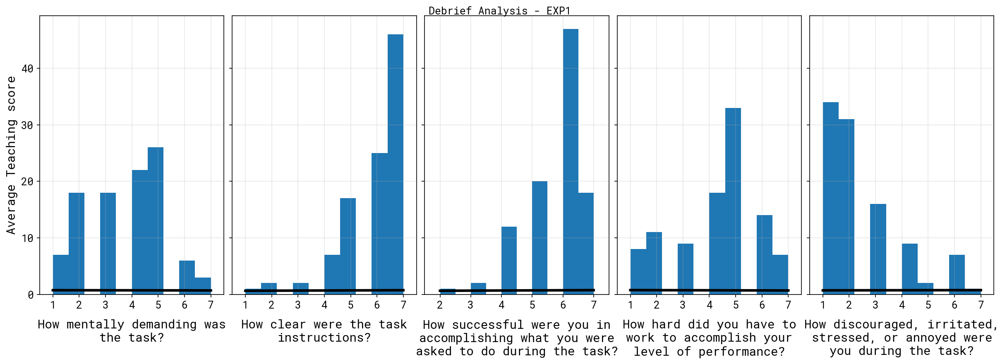

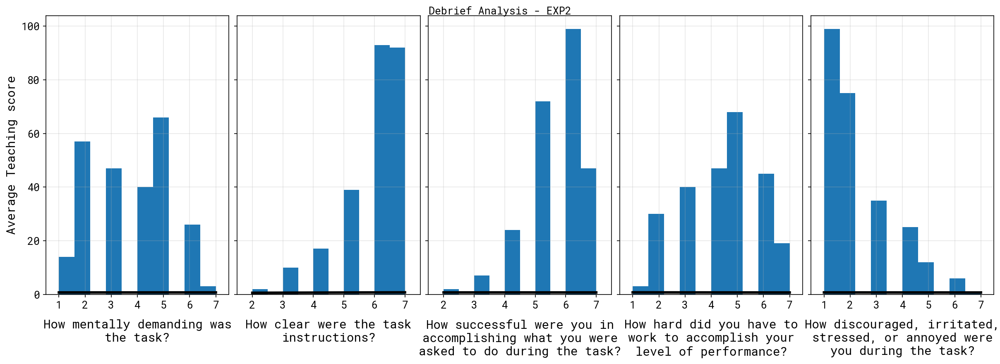

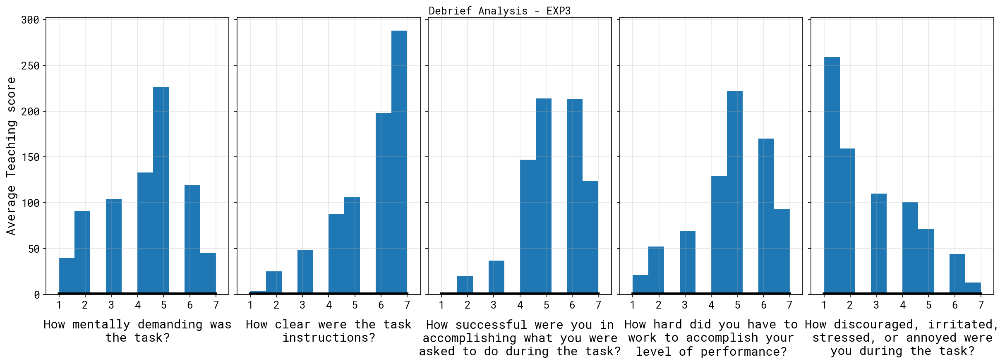

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
import textwrap

def plot_debrief_analysis(exp_name, data_folder='data/preprocessed', debrief_file=None):
    """
    Plot debrief ratings analysis for a given experiment.
    
    Parameters:
    -----------
    exp_name : str
        Experiment name (e.g., 'exp1', 'exp2', 'exp3')
    data_folder : str
        Base folder containing preprocessed data (default: 'data/preprocessed')
    debrief_file : str, optional
        Path to debrief CSV. If None, uses 'debrief_{exp_name}.csv'
    """
    
    # --- Load data ---
    preprocessed_path = f'{data_folder}/{exp_name}/preprocessed_{exp_name}.pkl'
    preprocessed = pd.read_pickle(preprocessed_path)
    
    if debrief_file is None:
        debrief_file = f'debrief_{exp_name}.csv'
    debrief = pd.read_csv(debrief_file)
    
    # --- Config ---
    ratings_cols = ['P0_Q1', 'P0_Q2', 'P0_Q3', 'P0_Q4', 'P0_Q5']
    titles = [
        'How mentally demanding was the task?',
        'How clear were the task instructions?',
        'How successful were you in accomplishing what you were asked to do during the task?',
        'How hard did you have to work to accomplish your level of performance?',
        'How discouraged, irritated, stressed, or annoyed were you during the task?'
    ]
    y_col = 'edge_normresp_U_obm'
    
    # --- Clean & merge ---
    for col in ratings_cols:
        debrief[col] = pd.to_numeric(debrief[col], errors='coerce')
    
    edge_mean = (
        preprocessed
        .groupby('subjID', as_index=False)[y_col]
        .mean()
    )
    
    merged = pd.merge(edge_mean, debrief[['subjID'] + ratings_cols], on='subjID', how='left')
    
    # --- Styling ---
    LABEL_FONTSIZE = 14
    TICK_FONTSIZE = 12
    ANNOT_FONTSIZE = 13
    
    plt.rcParams.update({
        'figure.dpi': 150,
        'savefig.dpi': 300,
        'axes.labelsize': LABEL_FONTSIZE,
        'xtick.labelsize': TICK_FONTSIZE,
        'ytick.labelsize': TICK_FONTSIZE,
    })
    
    # --- Create plots ---
    fig, axes = plt.subplots(1, 5, figsize=(16, 5.6), sharey=True, constrained_layout=True)
    fig.suptitle(f'Debrief Analysis - {exp_name.upper()}', fontsize=12, y=1.02)
    
    for ax, col, title in zip(axes, ratings_cols, titles):
        df = merged[[y_col, col]].dropna()
        x = df[col].to_numpy(dtype=float)
        y = df[y_col].to_numpy(dtype=float)
        n = len(df)
        
        # Histogram
        ax.hist(x)
        
        # Regression line
        if n >= 2 and np.nanstd(x) > 0 and np.nanstd(y) > 0:
            x_line = np.linspace(np.nanmin(x), np.nanmax(x), 100)
            m, b = np.polyfit(x, y, 1)
            ax.plot(x_line, m * x_line + b, linewidth=3, color='black')
        
        # Axis labels
        wrapped = textwrap.fill(title, width=28)
        ax.set_xlabel(wrapped, labelpad=10, fontsize=LABEL_FONTSIZE)
        
        # Grid + ticks
        ax.grid(True, alpha=0.3)
        uniq = np.unique(x[~np.isnan(x)])
        if uniq.size:
            if np.allclose(uniq, np.round(uniq)):
                uniq = np.unique(np.round(uniq).astype(int))
            ax.set_xticks(uniq)
            ax.set_xlim(uniq.min() - 0.5, uniq.max() + 0.5)
    
    axes[0].set_ylabel('Average Teaching score', fontsize=LABEL_FONTSIZE)
    plt.show()
    
    return fig, merged


# --- Usage examples ---

# Plot exp1
fig1, data1 = plot_debrief_analysis('exp1')

# Plot exp2
fig2, data2 = plot_debrief_analysis('exp2')

# Plot exp3
fig3, data3 = plot_debrief_analysis('exp3')